In [1]:
!pip install pandas scikit-learn flask joblib

Importing Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


Reading the csv file and converting it into a dataframe

In [3]:
df=pd.read_csv('/content/manufacturing_defect_dataset.csv')

In [4]:
dataset=pd.DataFrame(df)

In [5]:
df.head()

,ProductionVolume,ProductionCost,SupplierQuality,DeliveryDelay,DefectRate,QualityScore,MaintenanceHours,DowntimePercentage,InventoryTurnover,StockoutRate,WorkerProductivity,SafetyIncidents,EnergyConsumption,EnergyEfficiency,AdditiveProcessTime,AdditiveMaterialCost,DefectStatus
0,202,13175.403783,86.648534,1,3.121492,63.463494,9,0.052343,8.630515,0.081322,85.042379,0,2419.616785,0.468947,5.551639,236.439301,1
1,535,19770.046093,86.310664,4,0.819531,83.697818,20,4.908328,9.296598,0.038486,99.657443,7,3915.566713,0.119485,9.080754,353.957631,1
2,960,19060.820997,82.132472,0,4.514504,90.350550,1,2.464923,5.097486,0.002887,92.819264,2,3392.385362,0.496392,6.562827,396.189402,1
3,370,5647.606037,87.335966,5,0.638524,67.628690,8,4.692476,3.577616,0.055331,96.887013,8,4652.400275,0.183125,8.097496,164.135870,1
4,206,7472.222236,81.989893,3,3.867784,82.728334,9,2.746726,6.851709,0.068047,88.315554,7,1581.630332,0.263507,6.406154,365.708964,1


Dataset information

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3240 entries, 0 to 3239
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ProductionVolume      3240 non-null   int64  
 1   ProductionCost        3240 non-null   float64
 2   SupplierQuality       3240 non-null   float64
 3   DeliveryDelay         3240 non-null   int64  
 4   DefectRate            3240 non-null   float64
 5   QualityScore          3240 non-null   float64
 6   MaintenanceHours      3240 non-null   int64  
 7   DowntimePercentage    3240 non-null   float64
 8   InventoryTurnover     3240 non-null   float64
 9   StockoutRate          3240 non-null   float64
 10  WorkerProductivity    3240 non-null   float64
 11  SafetyIncidents       3240 non-null   int64  
 12  EnergyConsumption     3240 non-null   float64
 13  EnergyEfficiency      3240 non-null   float64
 14  AdditiveProcessTime   3240 non-null   float64
 15  AdditiveMaterialCost 

In [7]:
df.describe()

,ProductionVolume,ProductionCost,SupplierQuality,DeliveryDelay,DefectRate,QualityScore,MaintenanceHours,DowntimePercentage,InventoryTurnover,StockoutRate,WorkerProductivity,SafetyIncidents,EnergyConsumption,EnergyEfficiency,AdditiveProcessTime,AdditiveMaterialCost,DefectStatus
count,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000,3240.000000
mean,548.523148,12423.018476,89.833290,2.558951,2.749116,80.134272,11.476543,2.501373,6.019662,0.050878,90.040115,4.591667,2988.494453,0.299776,5.472098,299.515479,0.840432
std,262.402073,4308.051904,5.759143,1.705804,1.310154,11.611750,6.872684,1.443684,2.329791,0.028797,5.723600,2.896313,1153.420820,0.116400,2.598212,116.379905,0.366261
min,100.000000,5000.174521,80.004820,0.000000,0.500710,60.010098,0.000000,0.001665,2.001611,0.000002,80.004960,0.000000,1000.720156,0.100238,1.000151,100.211137,0.000000
25%,322.000000,8728.829280,84.869219,1.000000,1.598033,70.103420,5.750000,1.264597,3.983249,0.026200,85.180203,2.000000,1988.140273,0.200502,3.228507,194.922058,1.000000
50%,549.000000,12405.204656,89.704861,3.000000,2.708775,80.265312,12.000000,2.465151,6.022389,0.051837,90.125743,5.000000,2996.822301,0.297470,5.437134,299.728918,1.000000
75%,775.250000,16124.462428,94.789936,4.000000,3.904533,90.353822,17.000000,3.774861,8.050222,0.075473,95.050838,7.000000,3984.788299,0.402659,7.741006,403.178283,1.000000
max,999.000000,19993.365549,99.989214,5.000000,4.998529,99.996993,23.000000,4.997591,9.998577,0.099997,99.996786,9.000000,4997.074741,0.499500,9.999749,499.982782,1.000000


Checking Null Values

In [8]:
df.isnull().sum()

,0
ProductionVolume,0
ProductionCost,0
SupplierQuality,0
DeliveryDelay,0
DefectRate,0
QualityScore,0
MaintenanceHours,0
DowntimePercentage,0
InventoryTurnover,0
StockoutRate,0


<Axes: >

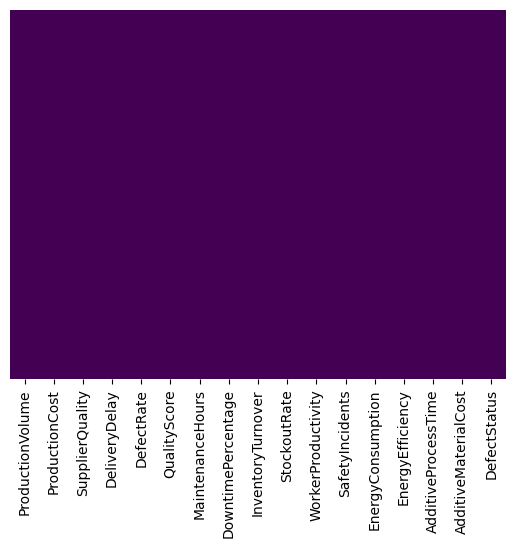

In [9]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [10]:
df.columns.unique()

Index(['ProductionVolume', 'ProductionCost', 'SupplierQuality',
       'DeliveryDelay', 'DefectRate', 'QualityScore', 'MaintenanceHours',
       'DowntimePercentage', 'InventoryTurnover', 'StockoutRate',
       'WorkerProductivity', 'SafetyIncidents', 'EnergyConsumption',
       'EnergyEfficiency', 'AdditiveProcessTime', 'AdditiveMaterialCost',
       'DefectStatus'],
      dtype='object')

In [11]:
# Check for unique values in each column
print("\nUnique Values in Each Column:")
for column in df.columns:
    print(f"{column}: {df[column].nunique()} unique values")



Unique Values in Each Column:
ProductionVolume: 862 unique values
ProductionCost: 3240 unique values
SupplierQuality: 3240 unique values
DeliveryDelay: 6 unique values
DefectRate: 3240 unique values
QualityScore: 3240 unique values
MaintenanceHours: 24 unique values
DowntimePercentage: 3240 unique values
InventoryTurnover: 3240 unique values
StockoutRate: 3240 unique values
WorkerProductivity: 3240 unique values
SafetyIncidents: 10 unique values
EnergyConsumption: 3240 unique values
EnergyEfficiency: 3240 unique values
AdditiveProcessTime: 3240 unique values
AdditiveMaterialCost: 3240 unique values
DefectStatus: 2 unique values


Exploratory Data Analysis

Histogram-To visualize the distribution of Production Volume

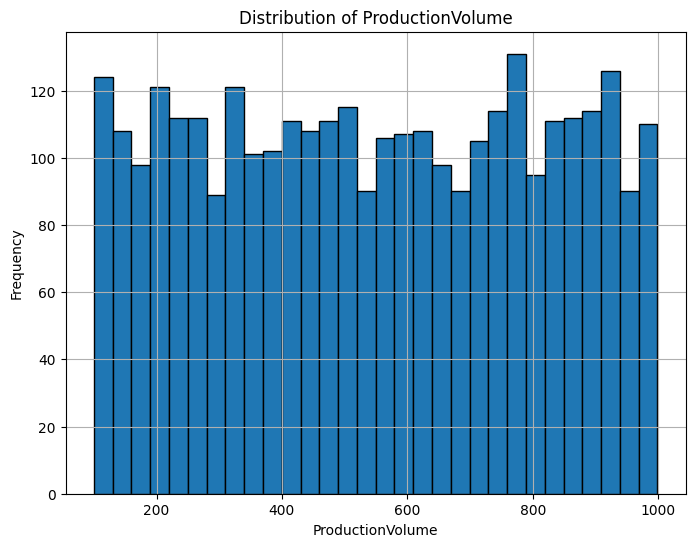

In [ ]:
plt.figure(figsize=(8, 6))
df['ProductionVolume'].hist(bins=30, edgecolor='black')
plt.title('Distribution of ProductionVolume')
plt.xlabel('ProductionVolume')
plt.ylabel('Frequency')
plt.show()


Boxplots for numerical columns against DefectStatus

In [ ]:
numerical_columns = [
    'ProductionVolume', 'ProductionCost', 'SupplierQuality', 'DeliveryDelay',
    'DefectRate', 'QualityScore', 'MaintenanceHours', 'DowntimePercentage',
    'InventoryTurnover', 'StockoutRate', 'WorkerProductivity',
    'EnergyConsumption', 'EnergyEfficiency', 'AdditiveProcessTime', 'AdditiveMaterialCost'
]

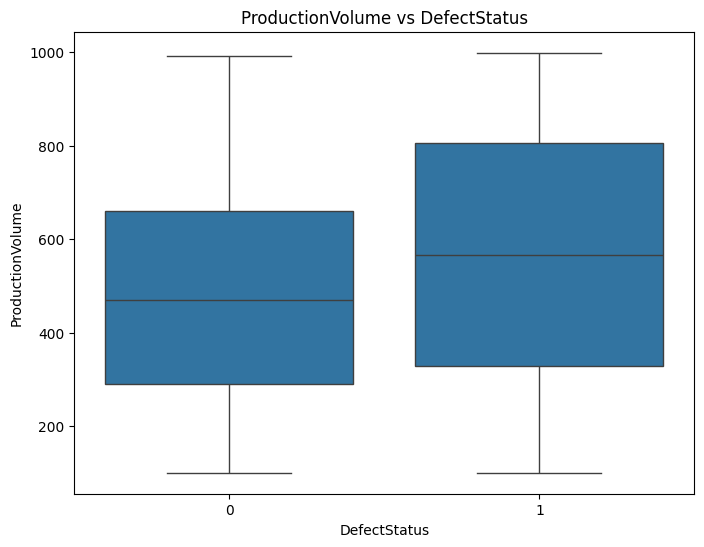

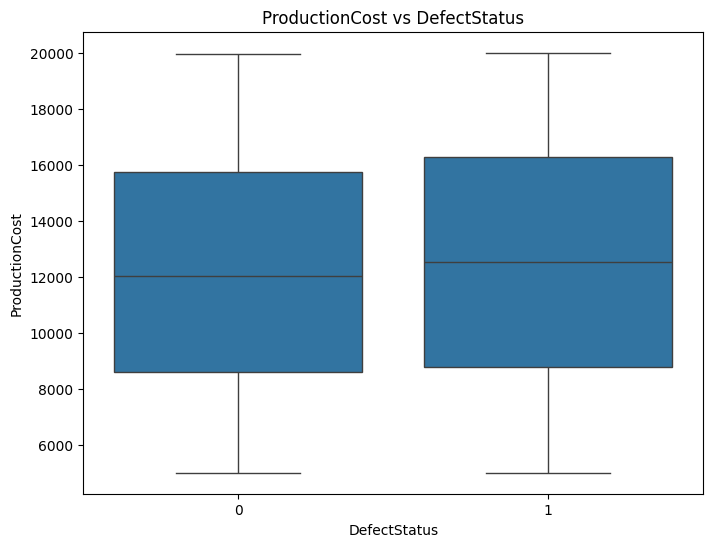

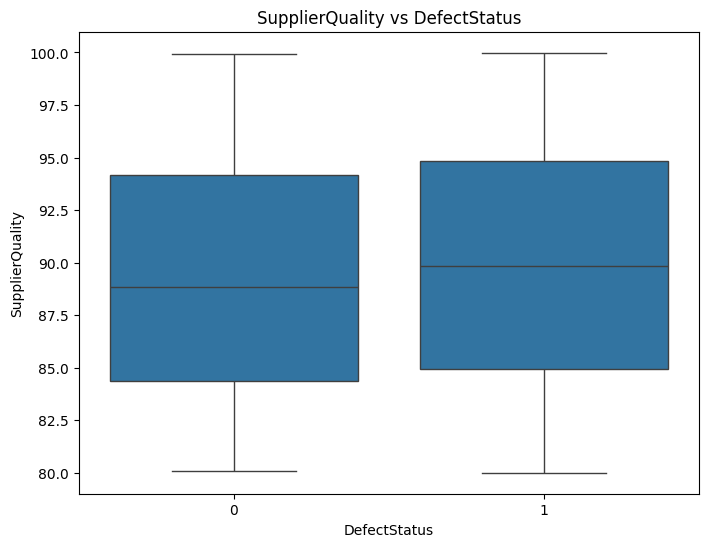

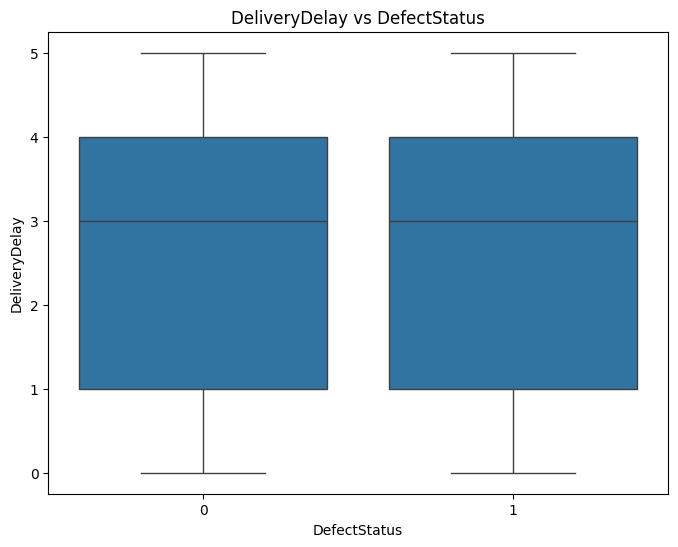

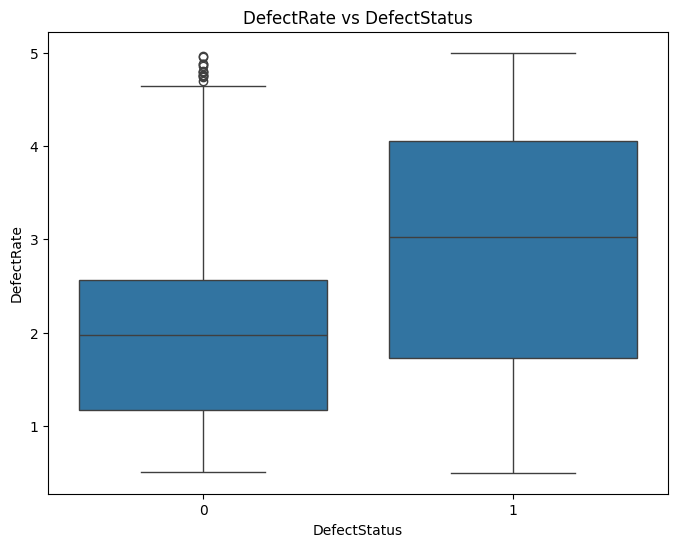

...

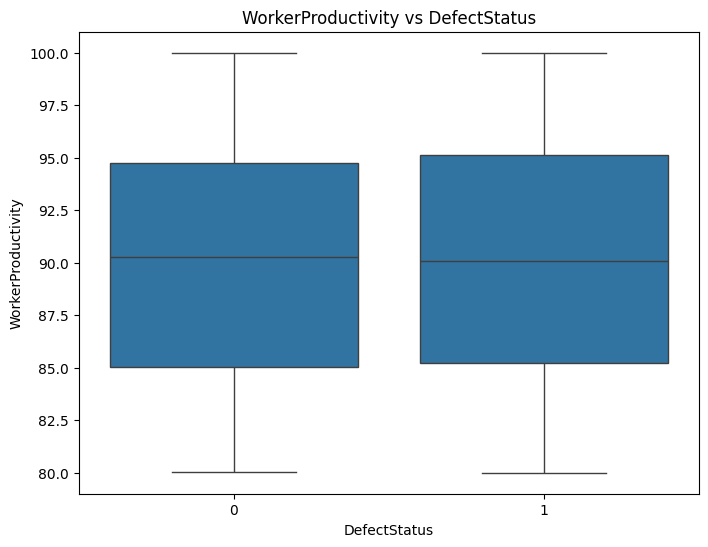

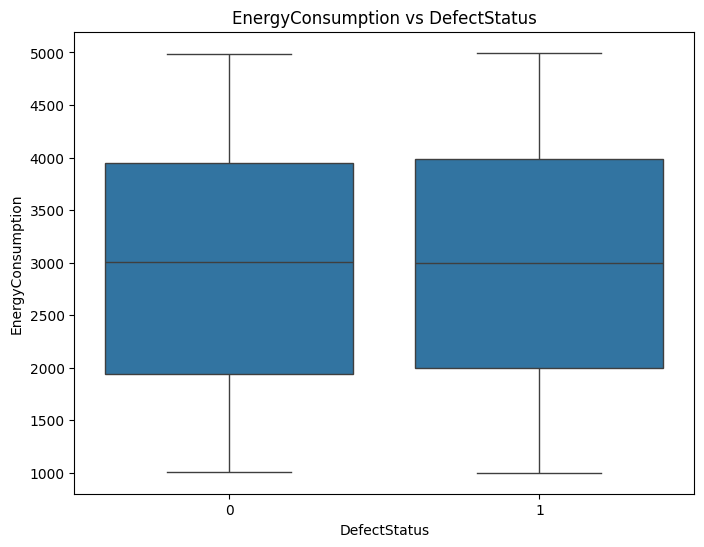

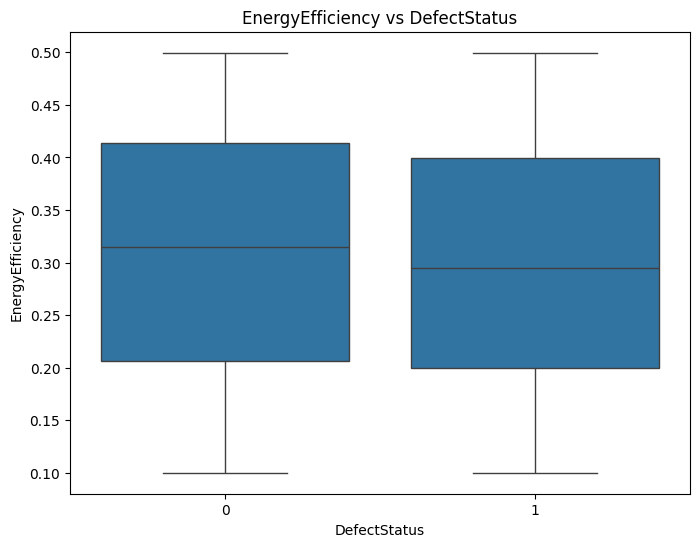

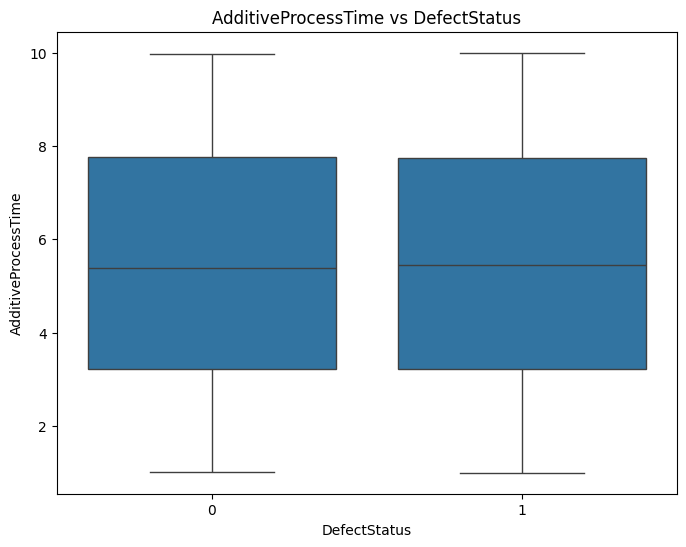

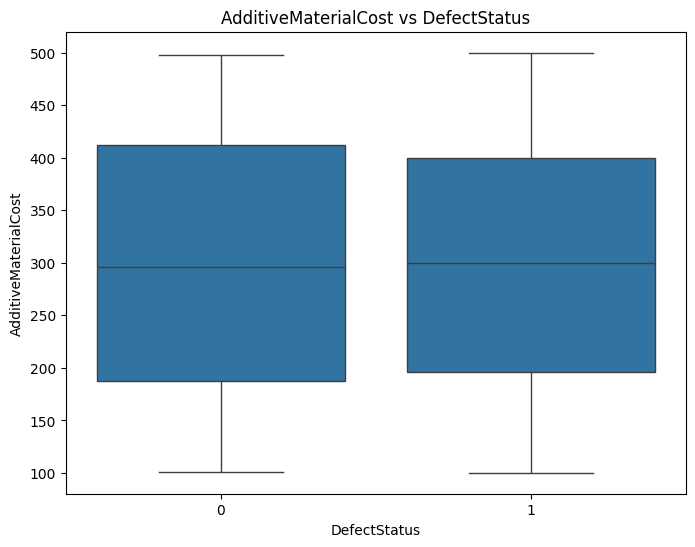

In [ ]:
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df['DefectStatus'], y=df[col])
    plt.title(f'{col} vs DefectStatus')
    plt.xlabel('DefectStatus')
    plt.ylabel(col)
    plt.show()


 Scatterplot for ProductionVolume vs ProductionCost colored by DefectStatus

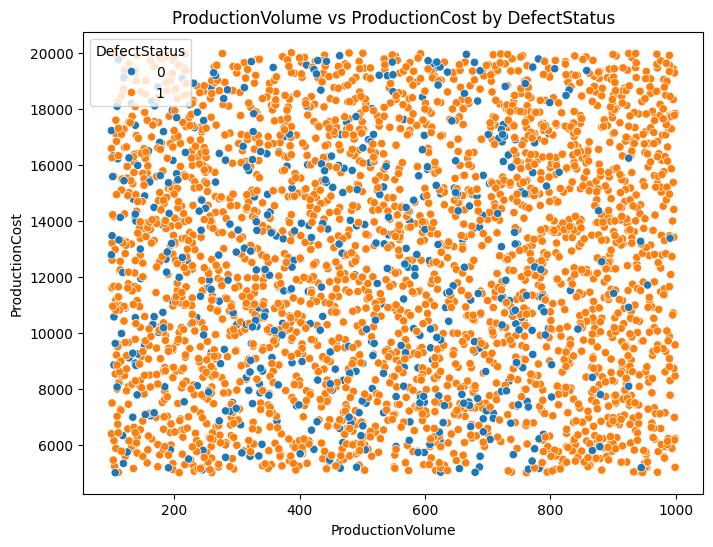

In [ ]:

plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['ProductionVolume'], y=df['ProductionCost'], hue=df['DefectStatus'])
plt.title('ProductionVolume vs ProductionCost by DefectStatus')
plt.xlabel('ProductionVolume')
plt.ylabel('ProductionCost')
plt.legend(title='DefectStatus')
plt.show()


Barplots for average numerical columns by DefectStatus

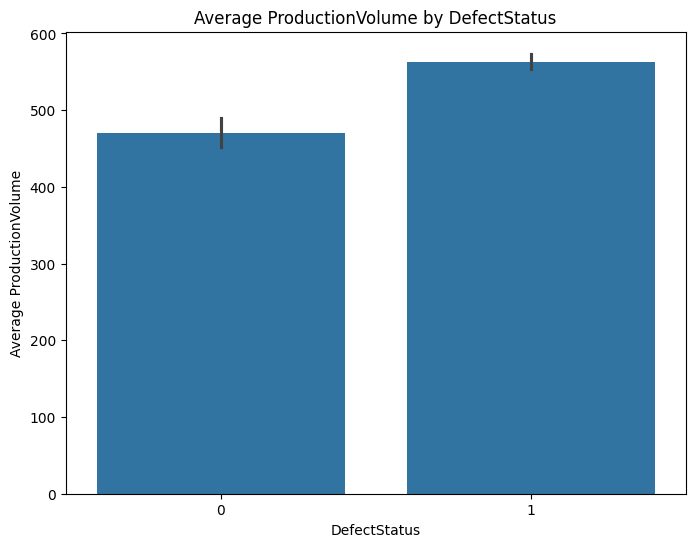

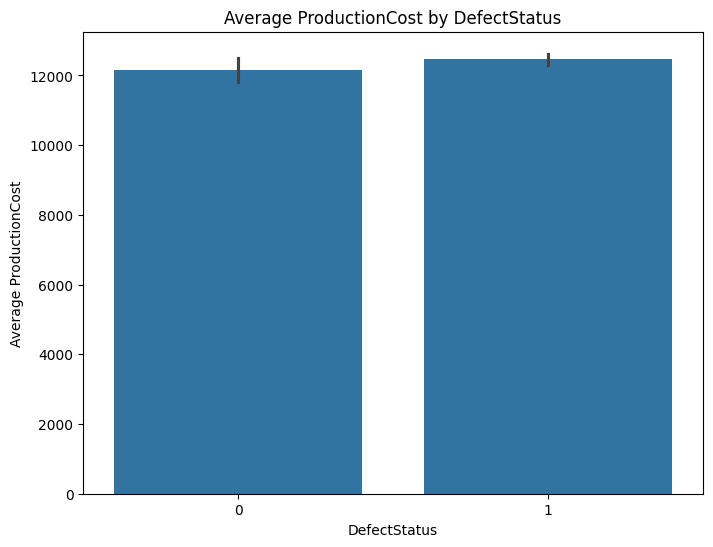

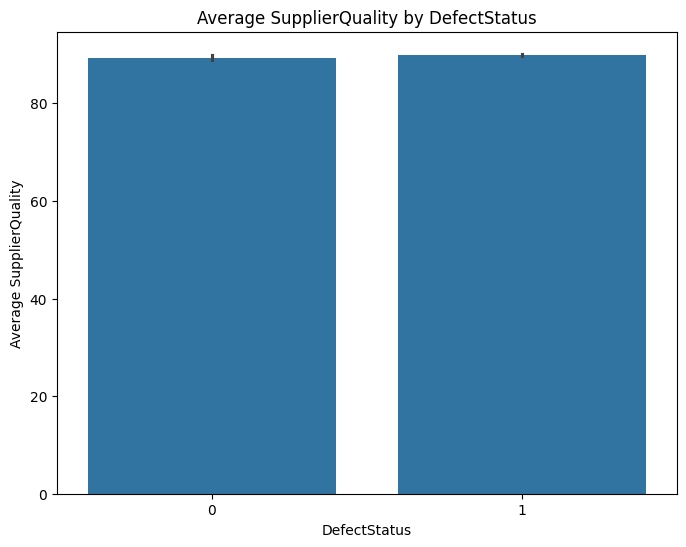

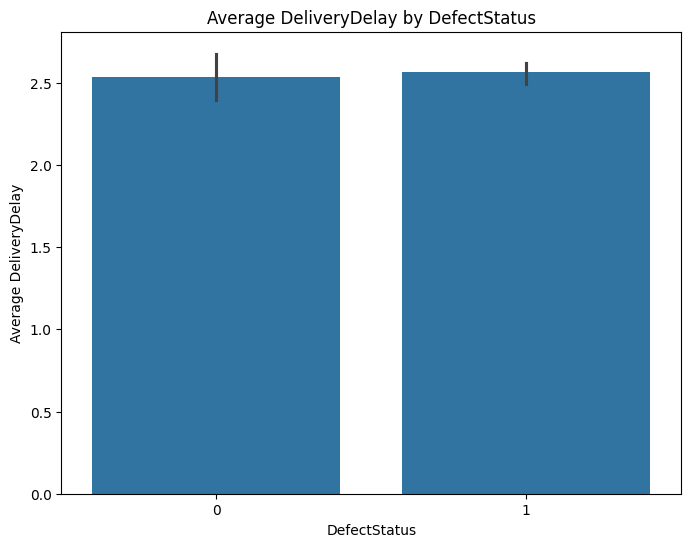

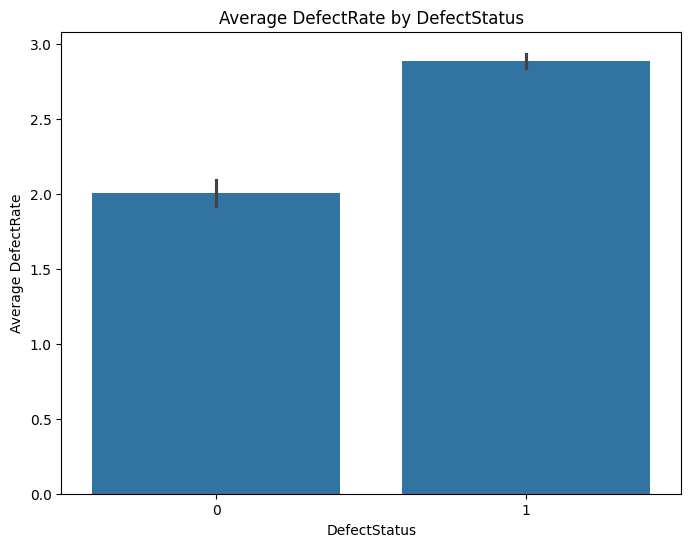

...

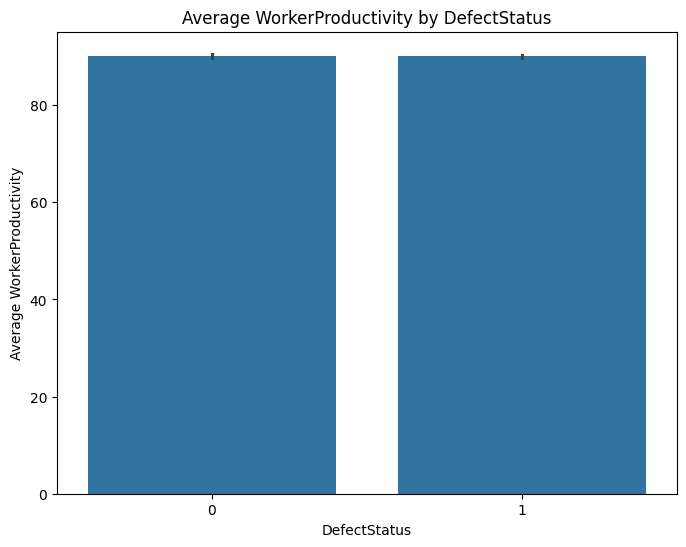

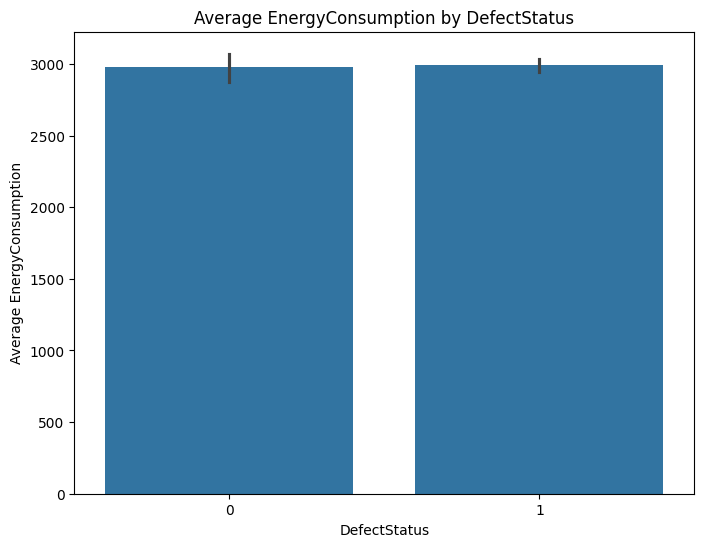

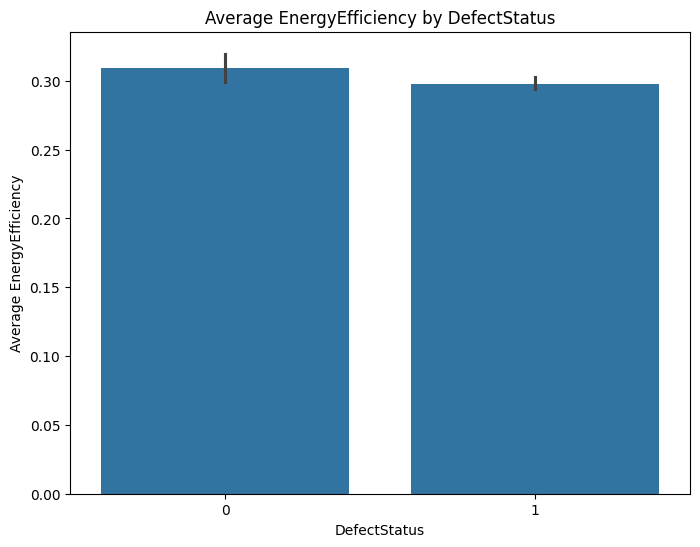

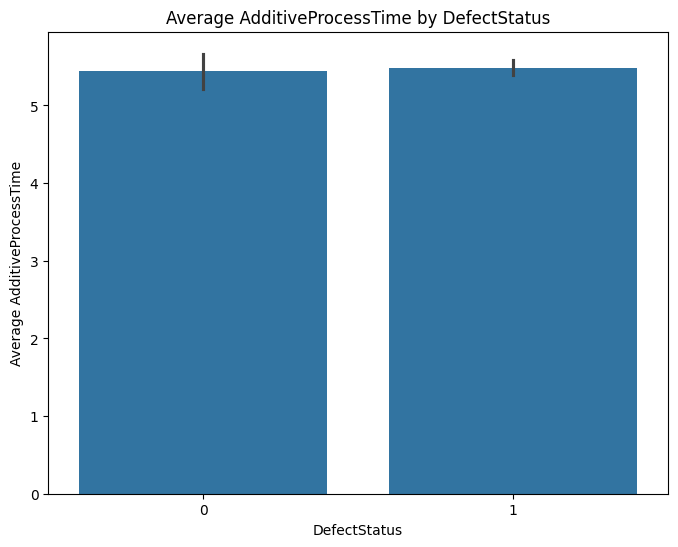

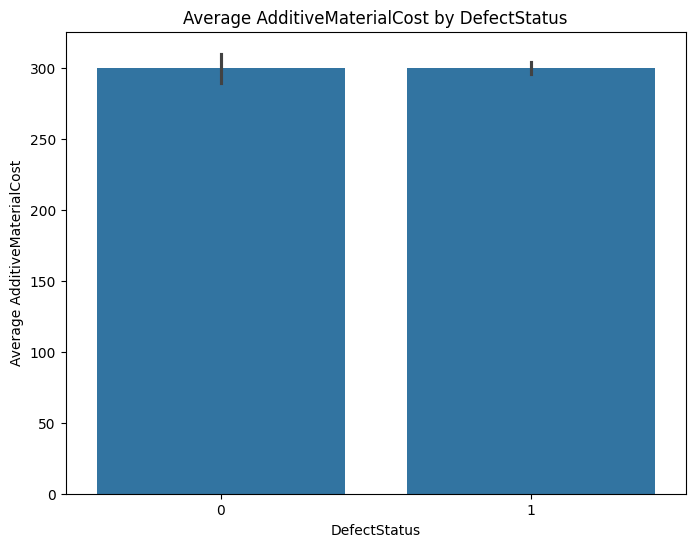

In [ ]:
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.barplot(x=df['DefectStatus'], y=df[col])
    plt.title(f'Average {col} by DefectStatus')
    plt.xlabel('DefectStatus')
    plt.ylabel(f'Average {col}')
    plt.show()


Pair Plot-to analyze relationships between multiple numerical features




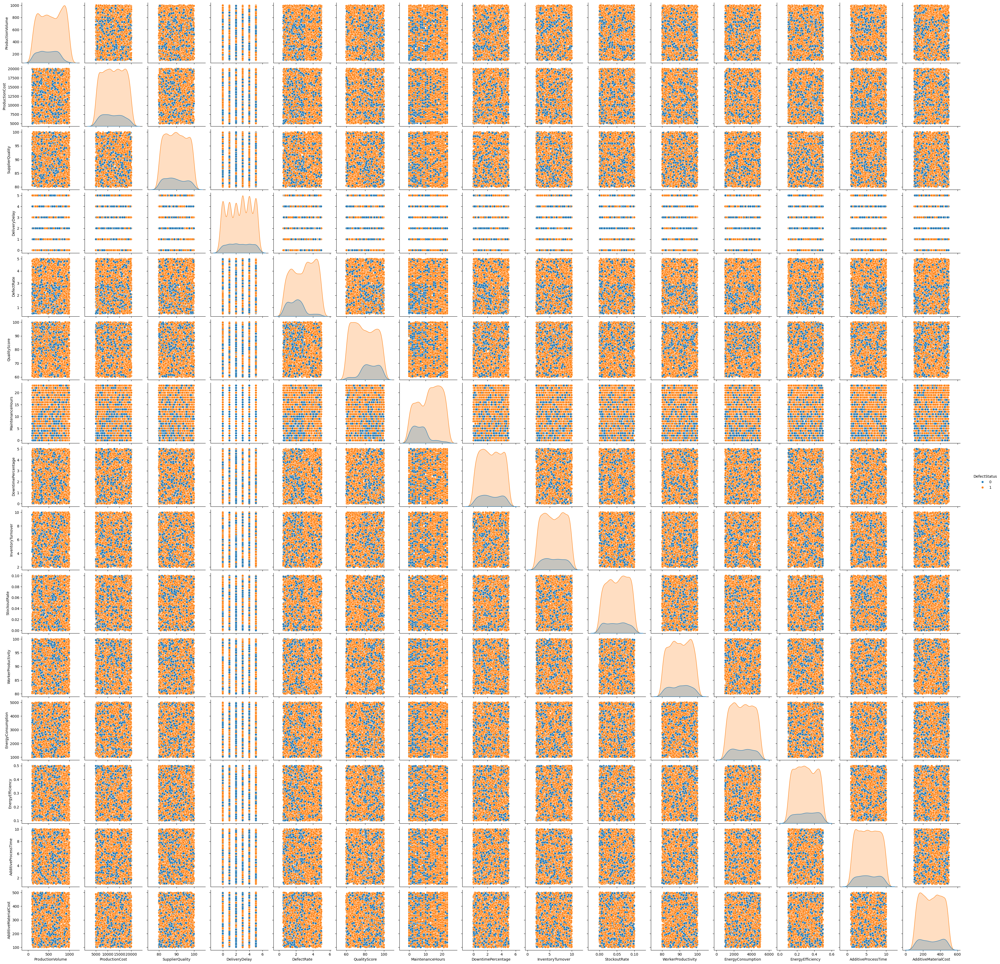

In [ ]:
sns.pairplot(df[numerical_columns + ['DefectStatus']], hue='DefectStatus', diag_kind='kde')
plt.show()



Correlation Analysis-To identify correlations between numerical features.

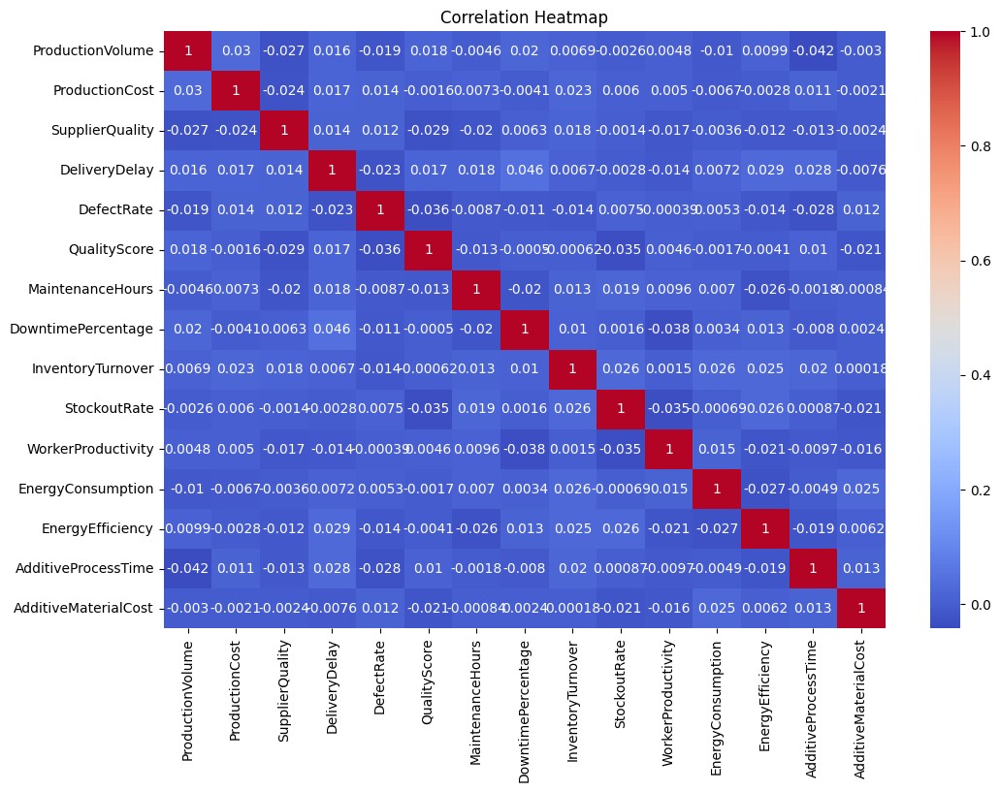

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(df[numerical_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


Model Training and Testing

In [12]:
x=df.drop(['DefectStatus'],axis=1)
y=df['DefectStatus']

In [13]:
from sklearn.preprocessing import StandardScaler


In [14]:
# Scale numeric features
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

Logistic Regression

In [15]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

In [16]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.2,random_state=42)

In [17]:
classifier=LogisticRegression()

In [18]:
classifier.fit(x_train,y_train)

LogisticRegression()

In [19]:
y_pred=classifier.predict(x_test)

In [20]:
y_pred

array([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,

In [21]:
from sklearn.metrics import confusion_matrix,accuracy_score

In [22]:
confusion_matrix(y_test,y_pred)

array([[ 41,  61],
       [ 19, 527]])

In [23]:
accuracy=accuracy_score(y_test,y_pred)

In [24]:
accuracy

0.8765432098765432

KNeighborsClassifier

In [25]:
from sklearn.neighbors import KNeighborsClassifier


In [26]:
knn_classifier=KNeighborsClassifier(n_neighbors=5)


In [27]:
knn_classifier.fit(x_train,y_train)

KNeighborsClassifier()

In [28]:
y_pred=knn_classifier.predict(x_test)
y_pred


array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,

In [29]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[ 45,  57],
       [ 20, 526]])

In [30]:
ac=accuracy_score(y_test,y_pred)
ac

0.8811728395061729

DecisionTreeClassifier

In [31]:
from sklearn.tree import DecisionTreeClassifier

In [32]:
dt_classifier=DecisionTreeClassifier()

In [33]:
dt_classifier.fit(x_train,y_train)

DecisionTreeClassifier()

In [34]:
y_pred=dt_classifier.predict(x_test)

In [35]:
y_pred

array([1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0,

In [36]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[ 80,  22],
       [ 43, 503]])

In [37]:
ac=accuracy_score(y_test,y_pred)

In [38]:
ac

0.8996913580246914

XGBoost (Extreme Gradient Boosting)


In [94]:
!pip install scikit-learn==1.2.2


  Using cached scikit_learn-1.2.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
Using cached scikit_learn-1.2.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (9.6 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.1
    Uninstalling scikit-learn-1.6.1:
      Successfully uninstalled scikit-learn-1.6.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imbalanced-learn 0.13.0 requires scikit-learn<2,>=1.3.2, but you have scikit-learn 1.2.2 which is incompatible.
mlxtend 0.23.3 requires scikit-learn>=1.3.1, but you have scikit-learn 1.2.2 which is incompatible.


In [95]:
!pip install --upgrade xgboost


In [96]:
from xgboost import XGBClassifier

In [97]:
xgb_classifier=XGBClassifier()

In [99]:
model = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
model.fit(x_train, y_train)

In [78]:
y_pred=model.predict(x_test)

In [79]:
y_pred

array([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [80]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[ 79,  23],
       [  9, 537]])

In [81]:
ac=accuracy_score(y_test,y_pred)
ac

0.9506172839506173

Highest Accuracy achieved with XGBoost (Extreme Gradient Boosting):95.06%


In [55]:
!pip install flask flask-ngrok pandas scikit-learn joblib xgboost


Flask API

In [56]:
import requests


Response after uploading the url

In [71]:
import requests

url = "  https://tall-sloths-stick.loca.lt/upload"
file_path = "/content/manufacturing_defect_dataset.csv"


with open(file_path, 'rb') as f:
    response = requests.post(url, files={'file': f})


try:
    print(response.json())
except requests.exceptions.JSONDecodeError:
    print("Error decoding JSON. Response text:", response.text)


{'columns': ['ProductionVolume', 'ProductionCost', 'SupplierQuality', 'DeliveryDelay', 'DefectRate', 'QualityScore', 'MaintenanceHours', 'DowntimePercentage', 'InventoryTurnover', 'StockoutRate', 'WorkerProductivity', 'SafetyIncidents', 'EnergyConsumption', 'EnergyEfficiency', 'AdditiveProcessTime', 'AdditiveMaterialCost', 'DefectStatus'], 'message': 'File uploaded successfully'}


In [76]:
import subprocess

command = [
    "curl",
    "-X", "POST",
    "-F", "file=@manufacturing_defect_dataset.csv",
    "https://tall-sloths-stick.loca.lt/upload"
]

result = subprocess.run(command, capture_output=True, text=True)
print("Response:", result.stdout)


Response: {"columns":["ProductionVolume","ProductionCost","SupplierQuality","DeliveryDelay","DefectRate","QualityScore","MaintenanceHours","DowntimePercentage","InventoryTurnover","StockoutRate","WorkerProductivity","SafetyIncidents","EnergyConsumption","EnergyEfficiency","AdditiveProcessTime","AdditiveMaterialCost","DefectStatus"],"message":"File uploaded successfully"}



Response after training the url

In [73]:
train_url = "  https://tall-sloths-stick.loca.lt/train"
response = requests.post(train_url)
print(response.json())


{'accuracy': 0.9506172839506173, 'f1_score': 0.9710669077757685, 'message': 'Model trained successfully'}


Response after prediction

In [74]:
predict_url = " https://tall-sloths-stick.loca.lt/predict"

input_data = {

  "ProductionVolume": 500,
  "ProductionCost": 10000,
  "SupplierQuality": 3,
  "DeliveryDelay": 2,
  "DefectRate": 5,
  "QualityScore": 85,
  "MaintenanceHours": 10,
  "DowntimePercentage": 0.05,
  "InventoryTurnover": 8,
  "StockoutRate": 0.01,
  "WorkerProductivity": 90,
  "SafetyIncidents": 0,
  "EnergyConsumption": 2000,
  "EnergyEfficiency": 0.5,
  "AdditiveProcessTime": 5,
  "AdditiveMaterialCost": 200


}


Prediction and confidence score of the data

In [75]:
response = requests.post(predict_url, json=input_data)
print(response.json())

{'Confidence': 0.89, 'DefectStatus': 1}
